In [2]:
import numpy as np
import pandas as pd
import folium
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN
from sklearn.cluster import AffinityPropagation
from sklearn.decomposition import PCA
import seaborn as sns
import matplotlib.pyplot as plt
from folium.plugins import MarkerCluster
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score,adjusted_mutual_info_score,completeness_score,homogeneity_score

from IPython.display import HTML, display
import ipywidgets

In [3]:
df=pd.read_csv(r"C:\Users\Mario\Documents\Labs\Module3\Project8_Uber Data Visualisation\uber-raw-data-aug14.csv")


In [4]:
pip install silhouette_score

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement silhouette_score (from versions: none)
ERROR: No matching distribution found for silhouette_score


In [5]:
df.dtypes


Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [6]:
df.isna().sum()
# u_sept.isna().sum()

Date/Time    0
Lat          0
Lon          0
Base         0
dtype: int64

In [7]:
# df['Date'] = pd.to_datetime(df['Date/Time']).dt.month
# df['Time'] = pd.to_datetime(df['Date/Time']).dt.day
# df['Time'] = pd.to_datetime(df['Date/Time']).dt.hour

In [8]:
df1=df.sample(frac=0.01, random_state=1)

In [9]:
df1

,Date/Time,Lat,Lon,Base
64470,8/5/2014 11:48:00,40.7036,-73.9907,B02598
304953,8/5/2014 14:34:00,40.7493,-73.9758,B02617
806937,8/23/2014 20:58:00,40.6953,-74.1775,B02764
745410,8/25/2014 1:44:00,40.7549,-73.9846,B02682
274496,8/2/2014 19:45:00,40.7650,-73.9208,B02617
...,...,...,...,...
303292,8/5/2014 11:22:00,40.7429,-73.9742,B02617
25029,8/24/2014 14:03:00,40.7358,-73.9948,B02512
37975,8/1/2014 19:06:00,40.7412,-73.9998,B02598
240911,8/30/2014 4:32:00,40.7954,-73.9636,B02598


In [10]:
# df1=df[['Date','Time','Lat','Lon','Base']]

In [11]:
df1['Day'] = pd.to_datetime(df1['Date/Time']).dt.day
df1['Hour'] = pd.to_datetime(df1['Date/Time']).dt.hour
df1['Weekday'] = pd.to_datetime(df1['Date/Time']).dt.day_name()

# uber['Day_Of_Week'] = pd.DatetimeIndex(uber['Date/Time']).day_name()


In [12]:
df1=df1.drop(['Date/Time'], axis=1)

In [13]:
# df1['Hour']=df1.Time.dt.hour
#df_group['weekday']=df_group.datetime.dt.day_name()

In [14]:
df1

,Lat,Lon,Base,Day,Hour,Weekday
64470,40.7036,-73.9907,B02598,5,11,Tuesday
304953,40.7493,-73.9758,B02617,5,14,Tuesday
806937,40.6953,-74.1775,B02764,23,20,Saturday
745410,40.7549,-73.9846,B02682,25,1,Monday
274496,40.7650,-73.9208,B02617,2,19,Saturday
...,...,...,...,...,...,...
303292,40.7429,-73.9742,B02617,5,11,Tuesday
25029,40.7358,-73.9948,B02512,24,14,Sunday
37975,40.7412,-73.9998,B02598,1,19,Friday
240911,40.7954,-73.9636,B02598,30,4,Saturday


In [15]:
# df_sampl=df1.sample(frac=0.01, random_state=1)
# df_sampl

In [16]:
dat_model=df1[['Lon','Lat']]
dat_model

,Lon,Lat
64470,-73.9907,40.7036
304953,-73.9758,40.7493
806937,-74.1775,40.6953
745410,-73.9846,40.7549
274496,-73.9208,40.7650
...,...,...
303292,-73.9742,40.7429
25029,-73.9948,40.7358
37975,-73.9998,40.7412
240911,-73.9636,40.7954


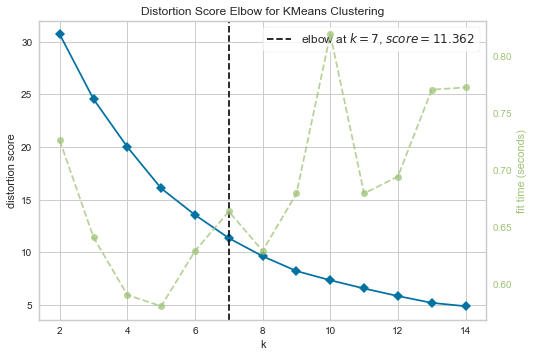

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [17]:
kmeans=KMeans()
visualizer = KElbowVisualizer(estimator = kmeans, k = (2,15))
visualizer.fit(dat_model)
visualizer.poof()

# df1.plot.scatter(x='Lat',y='Lon',c='Date')

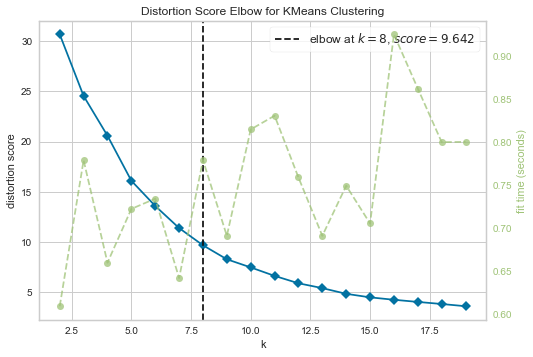

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [18]:
kmeans=KMeans()
visualizer = KElbowVisualizer(estimator = kmeans, k = (2,20))
visualizer.fit(dat_model)
visualizer.poof()

In [20]:
kmeans=KMeans(n_clusters=8)
kmeans.fit(dat_model)
kmeans.predict(dat_model)
kmeans.labels_
dat_model['KM_label']=kmeans.labels_

C:\Users\Mario\AppData\Local\Temp\ipykernel_3012\3031410165.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat_model['KM_label']=kmeans.labels_


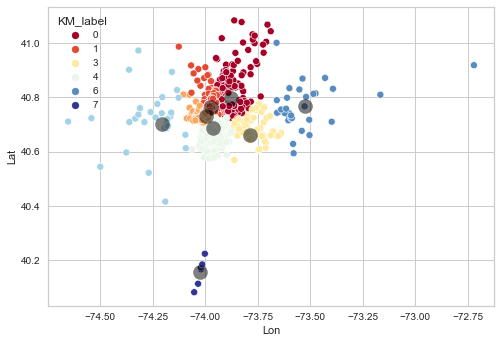

In [21]:
sns.scatterplot(data=dat_model, x='Lon', y='Lat',hue=dat_model['KM_label'], palette='RdYlBu')
centers = kmeans.cluster_centers_
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

In [21]:
centers

array([[-73.99768205,  40.73117154],
       [-73.78632062,  40.66093746],
       [-73.87918207,  40.79858207],
       [-74.20381429,  40.70185816],
       [-73.9619495 ,  40.68597152],
       [-73.52284194,  40.76984516],
       [-73.97173676,  40.76642314]])

In [25]:
DB=DBSCAN(eps=0.5, min_samples=8)
DB.fit(dat_model)
dat_model['DB_label']=DB.labels_
dat_model

C:\Users\Mario\AppData\Local\Temp\ipykernel_3012\2449166478.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dat_model['DB_label']=DB.labels_


,Lon,Lat,KM_label,DB_label
64470,-73.9907,40.7036,2,0
304953,-73.9758,40.7493,1,1
806937,-74.1775,40.6953,5,2
745410,-73.9846,40.7549,1,1
274496,-73.9208,40.7650,1,1
...,...,...,...,...
303292,-73.9742,40.7429,1,1
25029,-73.9948,40.7358,2,0
37975,-73.9998,40.7412,2,0
240911,-73.9636,40.7954,1,1


In [26]:
dat_model

,Lon,Lat,KM_label,DB_label
64470,-73.9907,40.7036,2,0
304953,-73.9758,40.7493,1,1
806937,-74.1775,40.6953,5,2
745410,-73.9846,40.7549,1,1
274496,-73.9208,40.7650,1,1
...,...,...,...,...
303292,-73.9742,40.7429,1,1
25029,-73.9948,40.7358,2,0
37975,-73.9998,40.7412,2,0
240911,-73.9636,40.7954,1,1


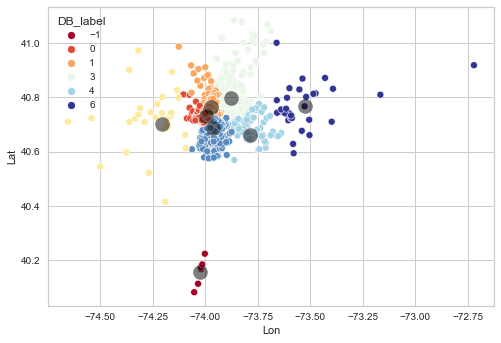

In [27]:
centers = kmeans.cluster_centers_
sns.scatterplot(data=dat_model, x='Lon', y='Lat',hue=dat_model['DB_label'], palette='RdYlBu')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

In [29]:
af = AffinityPropagation(max_iter=20, random_state=0).fit(dat_model)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_
labels

C:\Users\Mario\anaconda3\lib\site-packages\sklearn\cluster\_affinity_propagation.py:236: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


array([   0,    1, 3400, ..., 7679, 7680, 7681], dtype=int64)

In [30]:
from sklearn import metrics
silhouette_score_kmeans =metrics.silhouette_score(dat_model, labels=dat_model["KM_label"])
silhouette_score_kmeans

0.9788166334823858

In [52]:
calinski_harabasz_score_kmeans=calinski_harabasz_score(dat_model, labels=dat_model["KM_label"])
calinski_harabasz_score_kmeans

10337387.620610733

In [54]:
davies_bouldin_score_kmeans=davies_bouldin_score(dat_model,labels=dat_model["KM_label"])
davies_bouldin_score_kmeans(dat_model, labels=dat_model["KM_label"])

0.07300239473446479

ValueError: labels_true must be 1D: shape is (8293, 4)

In [53]:
df1.head(3)

,Lat,Lon,Base,Day,Hour,Weekday
64470,40.7036,-73.9907,B02598,5,11,Tuesday
304953,40.7493,-73.9758,B02617,5,14,Tuesday
806937,40.6953,-74.1775,B02764,23,20,Saturday


In [31]:
hourly_ride_data = df1.groupby(['Weekday','Hour'])['Base'].count()

hourly_ride_data=pd.DataFrame(hourly_ride_data)
hourly_ride_data.rename(columns = {'Base':'Pick_ups_per_Hour'}, inplace = True)
#df.reset_index()
hourly_ride_data

Pick_ups_per_Hour
Weekday   Hour                   
Friday    0                    34
          1                    22
          2                    12
          3                    21
          4                    19
...                           ...
Wednesday 19                   74
          20                   81
          21                   71
          22                   56
          23                   36

[168 rows x 1 columns]

<AxesSubplot:xlabel='Hour', ylabel='Pick_ups_per_Hour'>

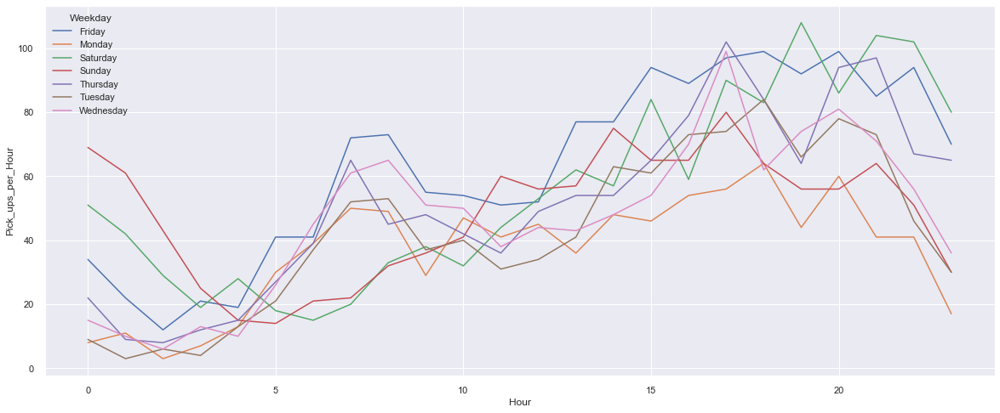

In [32]:
sns.set(rc = {'figure.figsize':(20,8)})
sns.lineplot(data=hourly_ride_data, x='Hour',y='Pick_ups_per_Hour', hue='Weekday')

In [62]:
# out = ipywidgets.Output(layout={'border': '1px solid black'})

# m = folium.Map(location=[40.7128, -74.0060], zoom_start=7)
# map_df=dat_model.copy()
# #map_df=map_df.sample(frac=0.1replace=True, random_state=1)
# map_df=map_df.reset_index()
# c={0:'green',1:'red',2:'orange',3:'blue',4:'crimson',5:'purple',6:'black',7:'pink'}
# for i in range(0,map_df.shape[0],1):
#     folium.Circle(location=[map_df.at[i,'Lat'],map_df.at[i,'Lon']],radius=1,color=c[map_df.at[i,'KM_label']]).add_to(m)

# # stores = [(-23.5578906,-46.6665546, 'store1','electronics'),
# #              (-23.562711,-46.674363, 'store2','home goods'),
# #              (-23.5642399,-46.6681833, 'store3','beauty'),
# #              (-23.584167,-46.678497, 'store4','electronics'),
# #              (-23.5956238,-46.6865377, 'store5','electronics'),
# #              (-23.5868682,-46.6773554,'store6','home goods'), 
# #              (-23.6011096,-46.6739275, 'store7','beauty'),
# #              (-23.6087354,-46.6973713, 'store8','home goods'),
# #              (-23.5943515,-46.6846959, 'store9','beauty')]

# df = pd.DataFrame(stores, columns=['LAT','LNG','NAME','CATEGORY'])

m = folium.Map(location=[df1['Lat'].mean(), df1['Lon'].mean()], zoom_start=12)

mCluster_h0 = MarkerCluster(name="00:00").add_to(m)
mCluster_h1 = MarkerCluster(name="01:00").add_to(m)
mCluster_h2 = MarkerCluster(name="02:00").add_to(m)
mCluster_h3 = MarkerCluster(name="03:00").add_to(m)
mCluster_h4 = MarkerCluster(name="04:00").add_to(m)
mCluster_h5 = MarkerCluster(name="05:00").add_to(m)
mCluster_h6 = MarkerCluster(name="06:00").add_to(m)
mCluster_h7 = MarkerCluster(name="07:00").add_to(m)
mCluster_h8 = MarkerCluster(name="08:00").add_to(m)
mCluster_h9 = MarkerCluster(name="09:00").add_to(m)
mCluster_h10 = MarkerCluster(name="10:00").add_to(m)
mCluster_h11 = MarkerCluster(name="11:00").add_to(m)
mCluster_h12 = MarkerCluster(name="12:00").add_to(m)
mCluster_h13 = MarkerCluster(name="13:00").add_to(m)
mCluster_h14 = MarkerCluster(name="14:00").add_to(m)
mCluster_h15 = MarkerCluster(name="15:00").add_to(m)
mCluster_h16 = MarkerCluster(name="16:00").add_to(m)
mCluster_h17 = MarkerCluster(name="17:00").add_to(m)
mCluster_h18 = MarkerCluster(name="18:00").add_to(m)
mCluster_h19 = MarkerCluster(name="19:00").add_to(m)
mCluster_h20 = MarkerCluster(name="20:00").add_to(m)
mCluster_h21 = MarkerCluster(name="21:00").add_to(m)
mCluster_h22 = MarkerCluster(name="22:00").add_to(m)
mCluster_h23 = MarkerCluster(name="23:00").add_to(m)


for row in df1.itertuples():
    #print(row)
    location = row[1], row[2]
    icon=folium.Icon(color='purple', icon='car-side', prefix='glyphicon')
    html = '''Hour: ''' + str(row[5]) # + '''<br>CATEGORY: ''' + row[4]
    iframe = folium.IFrame(html, width=300, height=130)
    popup = folium.Popup(iframe, max_width=300)
    marker = folium.Marker(location=location, popup=popup, icon=icon)
    #folium.Popup(popup).add_to(marker)
    #mCluster_bea.add_child(marker)
    if row[5] == 0:
        mCluster_h0.add_child(marker)
    elif row[5] == 1:
        mCluster_h1.add_child(marker)
    elif row[5] == 2:
        mCluster_h2.add_child(marker)
    elif row[5] == 3:
        mCluster_h3.add_child(marker)
    elif row[5] == 4:
        mCluster_h4.add_child(marker)
    elif row[5] == 5:
         mCluster_h5.add_child(marker)
    elif row[5] == 6:
        mCluster_h6.add_child(marker)
    elif row[5] == 7:
        mCluster_h7.add_child(marker)
    elif row[5] == 8:
        mCluster_h8.add_child(marker)
    elif row[5] == 9:
        mCluster_h9.add_child(marker)
    elif row[5] == 10:
        mCluster_h10.add_child(marker)
    elif row[5] == 11:
        mCluster_h11.add_child(marker)
    elif row[5] == 12:
        mCluster_h12.add_child(marker)
    elif row[5] == 13:
        mCluster_h13.add_child(marker)
    elif row[5] == 14:
        mCluster_h14.add_child(marker)
    elif row[5] == 15:
        mCluster_h15.add_child(marker)
    elif row[5] == 16:
        mCluster_h16.add_child(marker)
    elif row[5] == 17:
        mCluster_h17.add_child(marker)
    elif row[5] == 18:
        mCluster_h18.add_child(marker)
    elif row[5] == 19:
        mCluster_h19.add_child(marker)
    elif row[5] == 20:
        mCluster_h20.add_child(marker)
    elif row[5] == 21:
        mCluster_h21.add_child(marker)
    elif row[5] == 22:
        mCluster_h22.add_child(marker)
    elif row[5] == 23:
        mCluster_h23.add_child(marker)
        
folium.LayerControl().add_to(m); 

m
#out

In [34]:
sept=pd.read_csv(r"C:\Users\Mario\Documents\Labs\Module3\Project8_Uber Data Visualisation\uber-raw-data-sep14.csv")

In [35]:
sept.dtypes

Date/Time     object
Lat          float64
Lon          float64
Base          object
dtype: object

In [36]:
sept_samp=sept.sample(frac=0.01, random_state=1)
sept_samp

,Date/Time,Lat,Lon,Base
979562,9/24/2014 20:04:00,40.7025,-73.9934,B02764
247315,9/27/2014 4:12:00,40.7878,-73.9689,B02598
640768,9/29/2014 22:03:00,40.7375,-74.0083,B02617
777100,9/19/2014 12:34:00,40.7256,-74.0045,B02682
8565,9/7/2014 13:34:00,40.7613,-73.9738,B02512
...,...,...,...,...
722643,9/11/2014 16:19:00,40.7462,-73.9816,B02682
347333,9/6/2014 17:02:00,40.6499,-73.9651,B02617
96504,9/8/2014 19:56:00,40.7349,-73.9941,B02598
747047,9/14/2014 22:39:00,40.7476,-73.9563,B02682


In [37]:
sept_samp['Day'] = pd.to_datetime(sept_samp['Date/Time']).dt.day
sept_samp['Hour'] = pd.to_datetime(sept_samp['Date/Time']).dt.hour
sept_samp['Weekday'] = pd.to_datetime(sept_samp['Date/Time']).dt.day_name()
sept_samp

,Date/Time,Lat,Lon,Base,Day,Hour,Weekday
979562,9/24/2014 20:04:00,40.7025,-73.9934,B02764,24,20,Wednesday
247315,9/27/2014 4:12:00,40.7878,-73.9689,B02598,27,4,Saturday
640768,9/29/2014 22:03:00,40.7375,-74.0083,B02617,29,22,Monday
777100,9/19/2014 12:34:00,40.7256,-74.0045,B02682,19,12,Friday
8565,9/7/2014 13:34:00,40.7613,-73.9738,B02512,7,13,Sunday
...,...,...,...,...,...,...,...
722643,9/11/2014 16:19:00,40.7462,-73.9816,B02682,11,16,Thursday
347333,9/6/2014 17:02:00,40.6499,-73.9651,B02617,6,17,Saturday
96504,9/8/2014 19:56:00,40.7349,-73.9941,B02598,8,19,Monday
747047,9/14/2014 22:39:00,40.7476,-73.9563,B02682,14,22,Sunday


In [38]:
sept_samp=sept_samp.drop(['Date/Time'], axis=1)

In [39]:
sept_model=sept_samp[['Lon','Lat']]
sept_model

,Lon,Lat
979562,-73.9934,40.7025
247315,-73.9689,40.7878
640768,-74.0083,40.7375
777100,-74.0045,40.7256
8565,-73.9738,40.7613
...,...,...
722643,-73.9816,40.7462
347333,-73.9651,40.6499
96504,-73.9941,40.7349
747047,-73.9563,40.7476


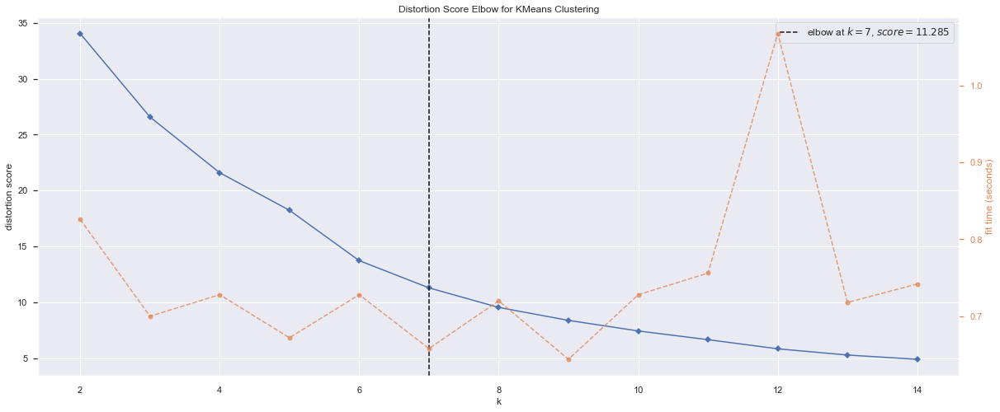

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [40]:
kmeans_sept=KMeans()
visualizer = KElbowVisualizer(estimator = kmeans_sept, k = (2,15))
visualizer.fit(sept_model)
visualizer.poof()

In [68]:
kmeans_sept=KMeans(n_clusters=6)
kmeans_sept.fit(sept_model)
kmeans_sept.predict(sept_model)
kmeans_sept.labels_
sept_model['KM_label']=kmeans_sept.labels_

C:\Users\Mario\AppData\Local\Temp\ipykernel_3012\2121669972.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sept_model['KM_label']=kmeans_sept.labels_


Text(0.5, 1.0, 'September')

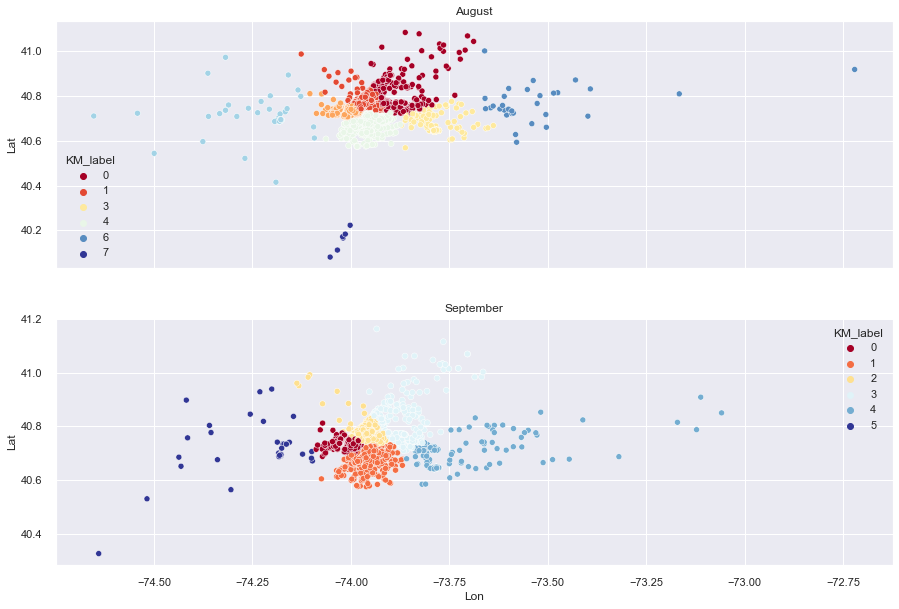

In [69]:
f, axes = plt.subplots(2, 1, figsize=(15, 10), sharex=True)
sns.scatterplot(data=dat_model, x='Lon', y='Lat',hue=dat_model['KM_label'], palette='RdYlBu',ax=axes[0])
sns.scatterplot(data=sept_model, x='Lon', y='Lat',hue=sept_model['KM_label'], palette='RdYlBu',ax=axes[1])
axes[0].set_title("August")
axes[1].set_title("September")

In [67]:
DB_sept=DBSCAN(eps=0.5, min_samples=6)
DB_sept.fit(sept_model)
sept_model['DB_label']=DB_sept.labels_
DB_sept

C:\Users\Mario\AppData\Local\Temp\ipykernel_3012\4253723630.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  sept_model['DB_label']=DB_sept.labels_


DBSCAN(min_samples=6)

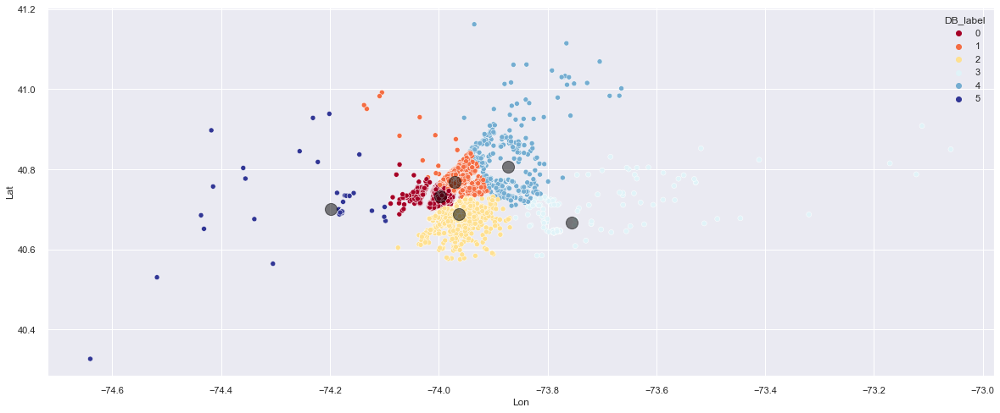

In [78]:
centers = kmeans_sept.cluster_centers_
sns.scatterplot(data=sept_model, x='Lon', y='Lat',hue=sept_model['DB_label'], palette='RdYlBu')
plt.scatter(centers[:, 0], centers[:, 1], c='black', s=200, alpha=0.5);

In [79]:
af = AffinityPropagation(max_iter=20, random_state=0).fit(sept_model)
cluster_centers_indices = af.cluster_centers_indices_
labels = af.labels_
labels

C:\Users\Mario\anaconda3\lib\site-packages\sklearn\cluster\_affinity_propagation.py:236: ConvergenceWarning: Affinity propagation did not converge, this model may return degenerate cluster centers and labels.
  warnings.warn(


array([   0,    1,    2, ..., 9461, 9462, 9463], dtype=int64)

In [64]:
silhouette_score_kmeans =metrics.silhouette_score(sept_model, labels=sept_model["KM_label"])
silhouette_score_kmeans

0.9680332625803821

In [65]:
calinski_harabasz_score_kmeans=calinski_harabasz_score(sept_model, labels=sept_model["KM_label"])
calinski_harabasz_score_kmeans


2388553.3069103393

In [66]:
davies_bouldin_score_kmeans=davies_bouldin_score(sept_model,labels=sept_model["KM_label"])
davies_bouldin_score_kmeans(sept_model, labels=sept_model["KM_label"])

TypeError: 'numpy.float64' object is not callable

In [47]:
sept

,Date/Time,Lat,Lon,Base
0,9/1/2014 0:01:00,40.2201,-74.0021,B02512
1,9/1/2014 0:01:00,40.7500,-74.0027,B02512
2,9/1/2014 0:03:00,40.7559,-73.9864,B02512
3,9/1/2014 0:06:00,40.7450,-73.9889,B02512
4,9/1/2014 0:11:00,40.8145,-73.9444,B02512
...,...,...,...,...
1028131,9/30/2014 22:57:00,40.7668,-73.9845,B02764
1028132,9/30/2014 22:57:00,40.6911,-74.1773,B02764
1028133,9/30/2014 22:58:00,40.8519,-73.9319,B02764
1028134,9/30/2014 22:58:00,40.7081,-74.0066,B02764


In [55]:
hourly_ride_sept = sept_samp.groupby(['Weekday','Hour'])['Base'].count()

hourly_ride_sept=pd.DataFrame(hourly_ride_sept)
hourly_ride_sept.rename(columns = {'Base':'Pick_ups_per_Hour'}, inplace = True)
#df.reset_index()
hourly_ride_sept



Pick_ups_per_Hour
Weekday   Hour                   
Friday    0                    26
          1                    18
          2                    12
          3                    23
          4                    18
...                           ...
Wednesday 19                   99
          20                   98
          21                   76
          22                   77
          23                   36

[168 rows x 1 columns]

<AxesSubplot:xlabel='Hour', ylabel='Pick_ups_per_Hour'>

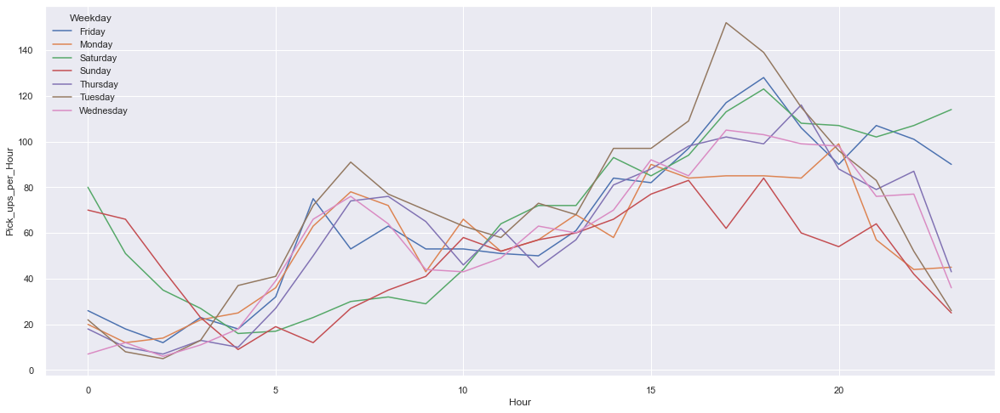

In [51]:
sns.set(rc = {'figure.figsize':(20,8)})
sns.lineplot(data=hourly_ride_sept, x='Hour',y='Pick_ups_per_Hour', hue='Weekday')

Text(0.5, 1.0, 'September')

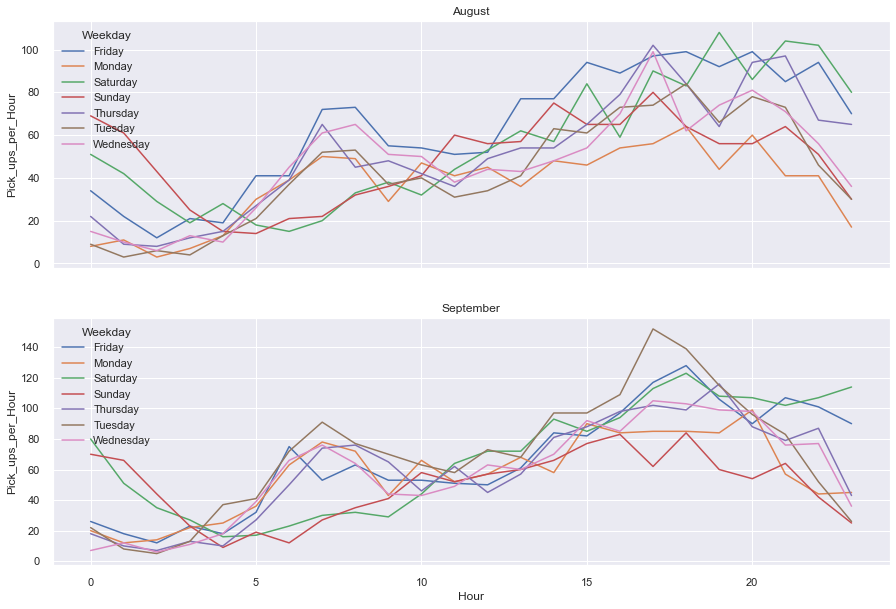

In [60]:
f, axes = plt.subplots(2, 1, figsize=(15, 10), sharex=True)
sns.lineplot(data=hourly_ride_data, x='Hour',y='Pick_ups_per_Hour', hue='Weekday',ax=axes[0])
sns.lineplot(data=hourly_ride_sept, x='Hour',y='Pick_ups_per_Hour', hue='Weekday',ax=axes[1])
axes[0].set_title("August")
axes[1].set_title("September")

In [ ]:
m1 = folium.Map(location=[df1['Lat'].mean(), df1['Lon'].mean()], zoom_start=12)

mCluster_h0 = MarkerCluster(name="00:00").add_to(m1)
mCluster_h1 = MarkerCluster(name="01:00").add_to(m1)
mCluster_h2 = MarkerCluster(name="02:00").add_to(m1)
mCluster_h3 = MarkerCluster(name="03:00").add_to(m1)
mCluster_h4 = MarkerCluster(name="04:00").add_to(m1)
mCluster_h5 = MarkerCluster(name="05:00").add_to(m1)
mCluster_h6 = MarkerCluster(name="06:00").add_to(m1)
mCluster_h7 = MarkerCluster(name="07:00").add_to(m1)
mCluster_h8 = MarkerCluster(name="08:00").add_to(m1)
mCluster_h9 = MarkerCluster(name="09:00").add_to(m1)
mCluster_h10 = MarkerCluster(name="10:00").add_to(m1)
mCluster_h11 = MarkerCluster(name="11:00").add_to(m1)
mCluster_h12 = MarkerCluster(name="12:00").add_to(m1)
mCluster_h13 = MarkerCluster(name="13:00").add_to(m1)
mCluster_h14 = MarkerCluster(name="14:00").add_to(m1)
mCluster_h15 = MarkerCluster(name="15:00").add_to(m1)
mCluster_h16 = MarkerCluster(name="16:00").add_to(m1)
mCluster_h17 = MarkerCluster(name="17:00").add_to(m1)
mCluster_h18 = MarkerCluster(name="18:00").add_to(m1)
mCluster_h19 = MarkerCluster(name="19:00").add_to(m1)
mCluster_h20 = MarkerCluster(name="20:00").add_to(m1)
mCluster_h21 = MarkerCluster(name="21:00").add_to(m1)
mCluster_h22 = MarkerCluster(name="22:00").add_to(m1)
mCluster_h23 = MarkerCluster(name="23:00").add_to(m1)


for row in sept_samp.itertuples():
    #print(row)
    location = row[1], row[2]
    icon=folium.Icon(color='purple', icon='car-side', prefix='glyphicon')
    html = '''Hour: ''' + str(row[5]) # + '''<br>CATEGORY: ''' + row[4]
    iframe = folium.IFrame(html, width=300, height=130)
    popup = folium.Popup(iframe, max_width=300)
    marker = folium.Marker(location=location, popup=popup, icon=icon)
    #folium.Popup(popup).add_to(marker)
    #mCluster_bea.add_child(marker)
    if row[5] == 0:
        mCluster_h0.add_child(marker)
    elif row[5] == 1:
        mCluster_h1.add_child(marker)
    elif row[5] == 2:
        mCluster_h2.add_child(marker)
    elif row[5] == 3:
        mCluster_h3.add_child(marker)
    elif row[5] == 4:
        mCluster_h4.add_child(marker)
    elif row[5] == 5:
         mCluster_h5.add_child(marker)
    elif row[5] == 6:
        mCluster_h6.add_child(marker)
    elif row[5] == 7:
        mCluster_h7.add_child(marker)
    elif row[5] == 8:
        mCluster_h8.add_child(marker)
    elif row[5] == 9:
        mCluster_h9.add_child(marker)
    elif row[5] == 10:
        mCluster_h10.add_child(marker)
    elif row[5] == 11:
        mCluster_h11.add_child(marker)
    elif row[5] == 12:
        mCluster_h12.add_child(marker)
    elif row[5] == 13:
        mCluster_h13.add_child(marker)
    elif row[5] == 14:
        mCluster_h14.add_child(marker)
    elif row[5] == 15:
        mCluster_h15.add_child(marker)
    elif row[5] == 16:
        mCluster_h16.add_child(marker)
    elif row[5] == 17:
        mCluster_h17.add_child(marker)
    elif row[5] == 18:
        mCluster_h18.add_child(marker)
    elif row[5] == 19:
        mCluster_h19.add_child(marker)
    elif row[5] == 20:
        mCluster_h20.add_child(marker)
    elif row[5] == 21:
        mCluster_h21.add_child(marker)
    elif row[5] == 22:
        mCluster_h22.add_child(marker)
    elif row[5] == 23:
        mCluster_h23.add_child(marker)
        
folium.LayerControl().add_to(m); 

m